In [1]:
# !pip install icevision[all,dev]

In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

## Imports

In [3]:
from icevision.all import *
from fastai.callback.wandb import *
from fastai.callback.tracker import SaveModelCallback
import wandb
from datetime import *


In [4]:
# #Download Datset 
# #Uncomment on first use to download and extract dataset
# from pydrive.auth import GoogleAuth
# from pydrive.drive import GoogleDrive
# from google.colab import auth
# from oauth2client.client import GoogleCredentials

# auth.authenticate_user()
# gauth = GoogleAuth()
# gauth.credentials = GoogleCredentials.get_application_default()
# drive = GoogleDrive(gauth)

# downloaded = drive.CreateFile({'id':"1BCqjhvI9k6h65qM6ZLTwXgdzRVH08tFD"})  
# downloaded.GetContentFile('WSI_PATCHES.7z') 

# #Unpack zip
# !p7zip -d WSI_PATCHES.7z

In [5]:
data_dir = Path('./WSI_PATCHES/Mitosis_1class_768_1slide')


In [6]:
parser = parsers.coco(annotations_file=data_dir / "Coco.json",
                     img_dir=data_dir / 'patches',
                     mask=False)

In [7]:
#Parameters

#Class Map
# class_map = ClassMap(['unkown','mitotic figure'])
# class_map = ClassMap(['unkown','granulocyte', 'mitotic figure', 'tumor cell'])
class_map = ClassMap(['unkown','mitotic figure'])


params = dict(
    epochs=80,
    classes=len(class_map),
    class_map=class_map,
    size=384,
    size_trans=512,
    batch_size=5,
    learning_rate=3e-2,
    architecture="CNN",
    model='tf_efficientdet_d2'
    )
params.update(dataset="Mitosis_1Class_"+str(params['size']))
params.update(wandb_run_name = "EffDet_SmallDS_2_" + str(params['size']) +"_"+ date.today().strftime("%m%d%Y"))
params.update(project= 'Mitosis02')
# print(params)

size = params['size']
size_trans = params['size_trans']


In [8]:
# Records
train_records, valid_records = parser.parse()

params.update(train_ds_size=len(train_records))
params.update(valid_ds_size=len(valid_records))

INFO     - Autofixing records | icevision.parsers.parser:parse:124


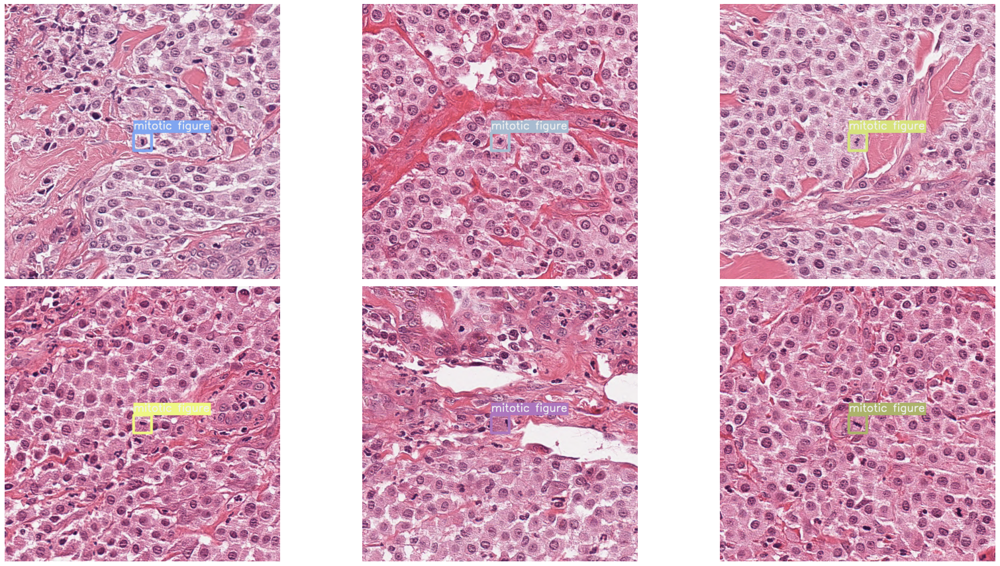

In [9]:
show_records(train_records[:6], ncols=3, class_map=class_map)

In [10]:
# Transforms
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=size_trans, presize=size), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])

In [11]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

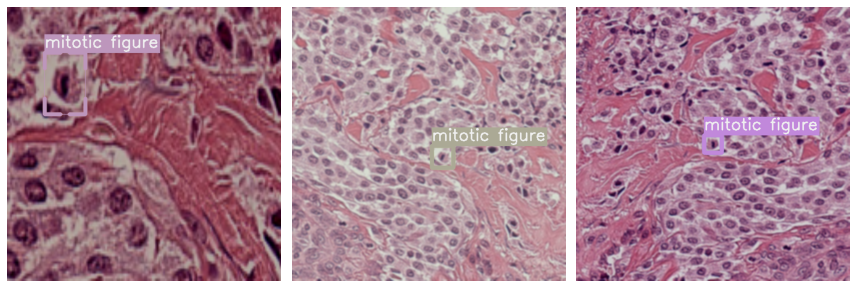

In [12]:
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3, class_map=class_map)

## DataLoader

In [13]:
# DataLoaders
train_dl = efficientdet.train_dl(train_ds, batch_size=params['batch_size'], num_workers=0, shuffle=True)
valid_dl = efficientdet.valid_dl(valid_ds, batch_size=params['batch_size'], num_workers=0, shuffle=False)

train_dl.batch_size

5

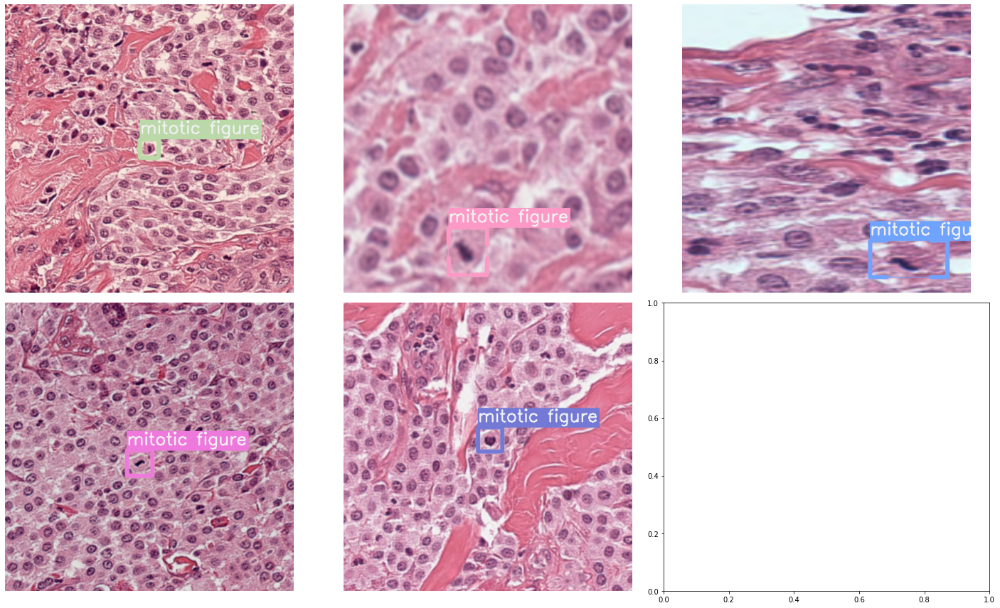

In [14]:
batch, samples = first(train_dl)
show_samples(samples[:6], class_map=class_map, ncols=3)

## Model & Metrics Setup

In [15]:
#Hypermater config for Wandb sweep
sweep_config = {
  "name": params['wandb_run_name'],
  "method": "grid",
  "parameters": {
        'epochs': {
            "values": [params['epochs']]
        },
        'batch_size':{
          'values':[params['batch_size']]
        },
        'learning_rate':{'values':[params['learning_rate']]
        },
        'optimizer': {
            'values': ['adam', 'nadam', 'sgd', 'rmsprop']
        },
        'activation': {
            'values': ['relu', 'elu', 'selu', 'softmax']
        },
        'train_ds_size': {
            'values':[params['train_ds_size']]
        }
    }
}
# sweep_id = wandb.sweep(sweep_config, entity='user', project='mitosis_01')
# print(sweep_config)

In [16]:
#EfficeientDet Model Config
model = efficientdet.model(model_name='tf_efficientdet_d2', 
                           num_classes=len(class_map), 
                           img_size=size_trans)

#Additional Models: tf_efficientdet_lite0

Downloading: "https://github.com/rwightman/efficientdet-pytorch/releases/download/v0.1/tf_efficientdet_d2_43-8107aa99.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientdet_d2_43-8107aa99.pth


In [17]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

In [18]:
#WanDB Config
# wandb.init(project=params['project'], name=params['wandb_run_name'], config=params)
# config = wandb.config

## Training


In [19]:
learn = efficientdet.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)
# learn = efficientdet.fastai.learner(dls=[train_dl, valid_dl], 
#                                     model=model, 
#                                     metrics=metrics,
#                                     cbs=[WandbCallback(log_preds=True, log_dataset=False, log_model=False), SaveModelCallback()]
#                                    )

In [20]:
learn.freeze()
# learn.lr_find()

In [22]:
# learn.fine_tune(10, 3e-2, freeze_epochs=10)
learn.fine_tune(60, 3e-2)
# learn.fine_tune(config.epochs, lr=config.learning_rate)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.822514,3.227068,0.000083,00:06


epoch,train_loss,valid_loss,COCOMetric,time
0,1.638003,2.034683,0.001287,00:04
1,1.523047,1.979725,0.002770,00:03
2,1.431182,1.979550,0.018447,00:03
3,1.379845,2.212428,0.001664,00:03
4,1.316142,1.906154,0.004768,00:03
5,1.256047,1.689850,0.123520,00:03
6,1.230587,2.020112,0.090168,00:03
7,1.208538,2.609676,0.072574,00:03
8,1.161230,4.959099,0.014027,00:03
9,1.131834,2.784770,0.026592,00:03


In [23]:
learn.freeze()
# learn.lr_find()

In [24]:
learn.fine_tune(10, 3e-7)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.343401,0.289444,0.481188,00:03


epoch,train_loss,valid_loss,COCOMetric,time
0,0.436843,0.292325,0.481188,00:03
1,0.389789,0.287512,0.494059,00:03
2,0.405427,0.276069,0.487129,00:03
3,0.421915,0.280694,0.481188,00:03
4,0.453167,0.287919,0.481188,00:03
5,0.454932,0.288418,0.472937,00:03
6,0.447438,0.283200,0.487129,00:03
7,0.440957,0.293147,0.466337,00:03
8,0.433692,0.285839,0.485743,00:03
9,0.442313,0.293500,0.456436,00:03


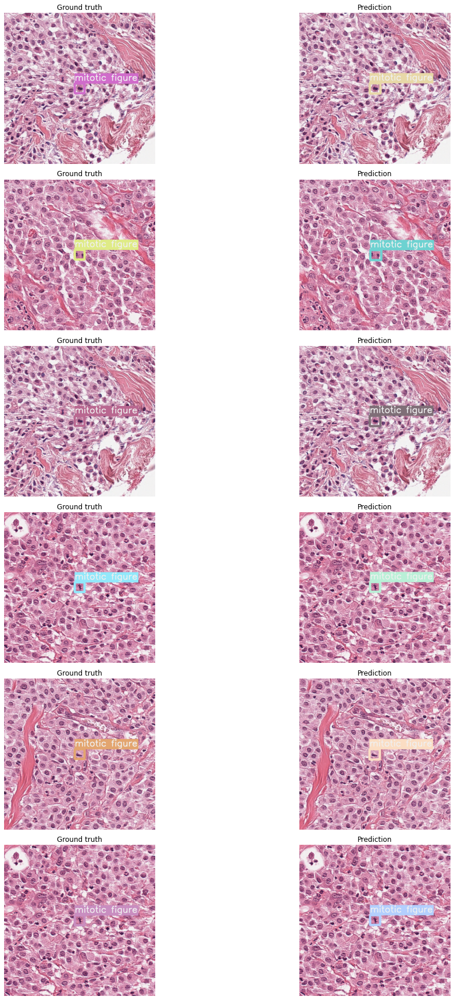

In [25]:
efficientdet.show_results(model, valid_ds, class_map=class_map)

In [26]:
valid_test_dl = efficientdet.infer_dl(valid_ds, batch_size=params['batch_size'])
samples, preds = efficientdet.predict_dl(model, valid_test_dl)

In [27]:
# wandb_images = wandb_img_preds(samples, preds, class_map, add_ground_truth=True) 

In [28]:
# wandb.log({"Predicted images": wandb_images})
# wandb.join()

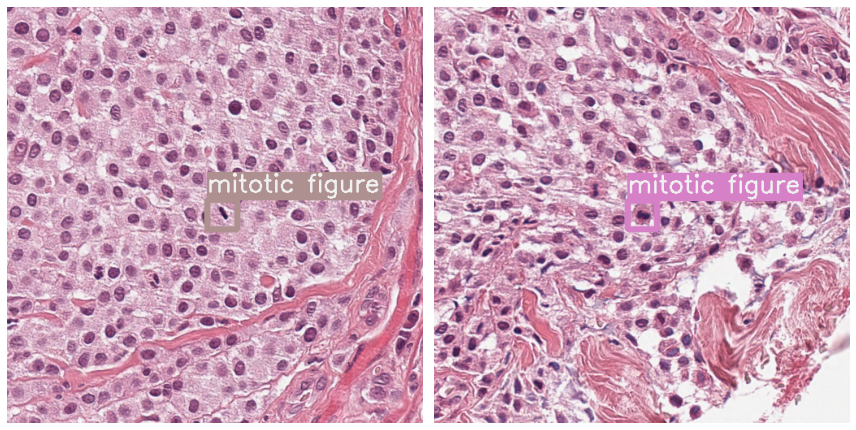

In [29]:
# Show inference on validation dataset
imgs = [sample["img"] for sample in samples]
imgs=imgs[:2]
show_preds(
    imgs,
    preds=preds[:2],
    class_map=class_map,
    denormalize_fn=denormalize_imagenet,
    ncols=2,
)

In [30]:
#Save model weights
torch.save(model.state_dict(), data_dir/'mitosis_tf_efficientdet_lite0.pth')

## Prediction from Saved Model

In [31]:
print(class_map)

<ClassMap: {'background': 0, 'unkown': 1, 'mitotic figure': 2}>


In [32]:
#Load Test Patches
import os
# directory = './WSI_PATCHES/MitosisTest_1024'
# directory = './WSI_PATCHES/MitosisTest_256'
directory = './WSI_PATCHES/MitosisTest_768'
# directory = '/home/bnapora/development/ml-pipeline/WSI_PATCHES/Mitosis01_256/test_patches_1024'
images = []

for filename in os.listdir(directory):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        imgfile = os.path.join(directory, filename)
        images.append(open_img(imgfile))
    else:
        continue
images = np.array(images)
images.shape

(2, 768, 768, 3)

In [33]:
print('size=',size)
print('size_trans=',size_trans)

size= 384
size_trans= 512


In [34]:
#Transforms used on train/valid ds
# valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])

test_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])
infer_ds = Dataset.from_images(images, test_tfms)

In [35]:
#Load Saved Model
model2 = efficientdet.model(model_name='tf_efficientdet_d2', 
                           num_classes=len(class_map), 
                           img_size=size_trans)
state_dict = torch.load(data_dir/'mitosis_tf_efficientdet_lite0.pth')
model2.load_state_dict(state_dict)
# model2.cpu()  #Don't seem to need to indicate cpu()

<All keys matched successfully>

In [36]:
infer_dl = efficientdet.infer_dl(infer_ds, batch_size=1)
samples_inf, preds_inf = efficientdet.predict_dl(model=model2, infer_dl=infer_dl)

In [37]:
# Check to see if predicitons were made
# preds_inf

(512, 512, 3)


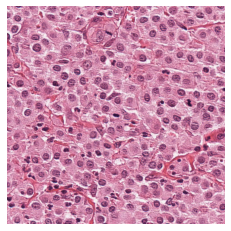

In [38]:
for sample in samples_inf:
    imgs = sample['img']
print(imgs.shape)
show_sample(samples_inf[0])

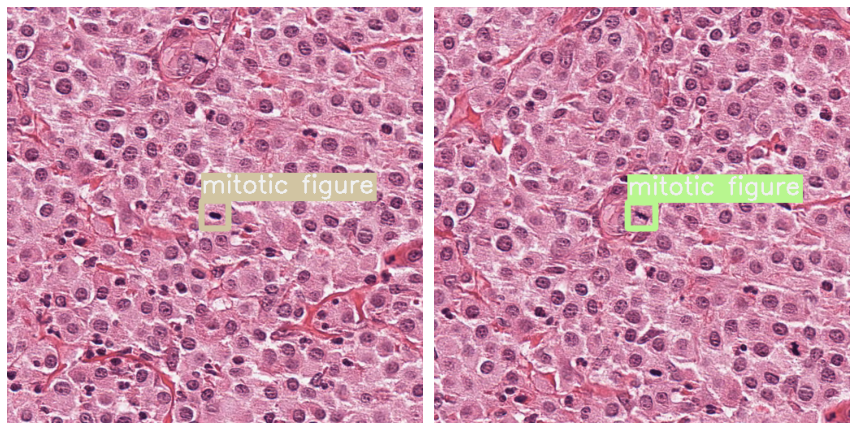

In [39]:
# Show samples
imgs = [sample["img"] for sample in samples_inf]
imgs=imgs[:4]
show_preds(
    imgs,
    preds=preds_inf[:4],
    class_map=class_map,
    denormalize_fn=denormalize_imagenet,
    ncols=2,
)